In [1]:
from PIL import Image
import os
import pandas as pd
import numpy as np
import datasets
from tqdm import tqdm
from datasets import Image as Image_ds # change name because of similar PIL module
from datasets import Dataset
from datasets import load_dataset
import urllib.parse
import json
import pickle
import matplotlib.pyplot as plt 
from sklearn.neighbors import NearestNeighbors
import sys
sys.path.append(os.path.abspath(".."))
from src.utils import plot_neighbors, pca_binary, plot_pca_scale
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from matplotlib.patches import Patch
from sklearn.metrics.pairwise import cosine_distances
import seaborn as sns
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.manifold import TSNE
from umap import UMAP

# we get a lot of annoying warnings from sklearn so we suppress them
import warnings
warnings.filterwarnings('ignore')

/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# read df from pickle 
data_path = os.path.join('..', 'data')
df = pd.read_pickle(os.path.join(data_path, 'paintings_canonized.pkl'))

In [3]:
# load image data
ds = load_dataset("louisebrix/smk_only_paintings", split="train") # all the data is in the 'train' split

In [4]:
# define color subset

# make subset of colored images only 
color_subset = df.query('rgb == "color"')
color_idx = color_subset.index.tolist()
ds_color = ds.select(color_idx)
color_subset = color_subset.reset_index(drop = True)

### PCA with images

Code taken from https://fcpython.com/visualisation/creating-scatter-plots-with-club-logos-in-python

 https://nextjournal.com/ml4a/image-t-sne 

In [5]:
# 
def getImage(img):
    return OffsetImage(np.array(img), zoom=.02, alpha = 1)


In [22]:
def pca_binary(ax, df, ds, embedding, filename):
    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # to 2 dimensions
    pca = PCA(n_components=2)
    pca_results = pca.fit_transform(embeddings_array)
    df_pca = pd.DataFrame(pca_results, columns=["PCA1", "PCA2"])
    
    ax.scatter(df_pca["PCA1"], df_pca["PCA2"], color='white')

    ax.set_xlabel("PCA1")
    ax.set_ylabel("PCA2")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_pca.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["PCA1"], row["PCA2"]), frameon=False)
        ax.add_artist(ab)

    plt.savefig(filename)

    np.seterr(divide='ignore', invalid='ignore')

/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:336: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintin

Text(0.5, 0.98, 'PCA with paintings, greyscale')

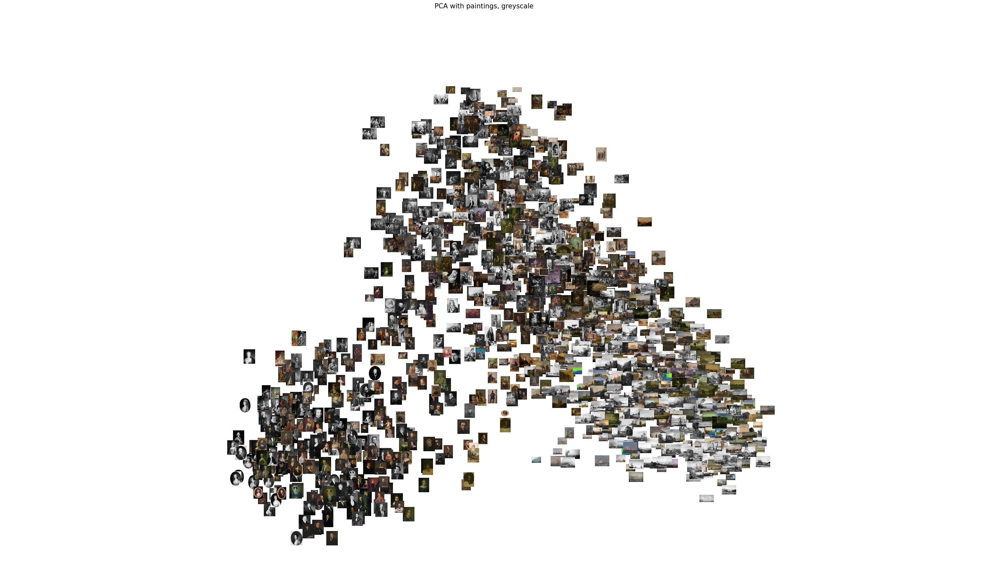

In [8]:
fig, axs = plt.subplots(1, 1, figsize=(40, 20))

pca_binary(axs, df, ds, 'grey_embedding', 'pca_paintings_grey.png')

fig.suptitle('PCA with paintings, greyscale', size = 15)


/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:335: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:336: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:340: RuntimeWarning: overflow encountered in matmul
  Q, _ = qr_normalizer(A @ Q)
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/site-packages/sklearn/utils/extmath.py:533: RuntimeWarning: overflow encountered in matmul
  B = Q.T @ M
/Users/au672746/Library/CloudStorage/OneDrive-Aarhusuniversitet/CHC/canon-paintings-smk/env/lib/python3.13/s

Text(0.5, 0.98, 'PCA with paintings, color')

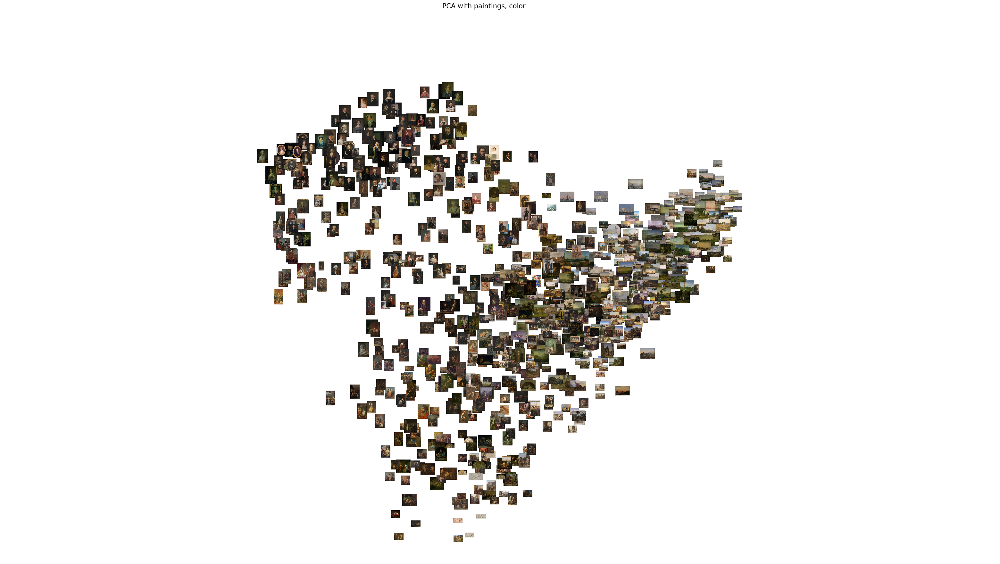

In [9]:
fig, axs = plt.subplots(1, 1, figsize=(40, 20))

pca_binary(axs, color_subset, ds_color, 'embedding', 'pca_paintings_color.png')

fig.suptitle('PCA with paintings, color', size = 15)

In [23]:
# t-SNE on PCA 

def t_sne_plot(ax, df, ds, embedding):

    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # to 2 dimensions
    pca = PCA(n_components=50)
    pca_results = pca.fit_transform(embeddings_array)

    X = np.array(pca_results)
    tsne = TSNE(n_components=2, learning_rate=150, perplexity=30, angle=0.2, verbose=2).fit_transform(X)

    tx, ty = tsne[:,0], tsne[:,1]
    tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
    ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

    tnse_results = {'tx': tx,
                    'ty': ty}

    df_tsne = pd.DataFrame(tnse_results)
    
    ax.scatter(df_tsne['tx'], df_tsne['ty'], color='white')

    ax.set_xlabel("")
    ax.set_ylabel("")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_tsne.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["tx"], row["ty"]), frameon=False)
        ax.add_artist(ab)

    #plt.savefig(filename)

    np.seterr(divide='ignore', invalid='ignore')

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1687 samples in 0.000s...
[t-SNE] Computed neighbors for 1687 samples in 0.068s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1687
[t-SNE] Computed conditional probabilities for sample 1687 / 1687
[t-SNE] Mean sigma: 7.261848
[t-SNE] Computed conditional probabilities in 0.017s
[t-SNE] Iteration 50: error = 71.8324356, gradient norm = 0.0182731 (50 iterations in 0.236s)
[t-SNE] Iteration 100: error = 70.4357758, gradient norm = 0.0018390 (50 iterations in 0.189s)
[t-SNE] Iteration 150: error = 70.4008636, gradient norm = 0.0008660 (50 iterations in 0.184s)
[t-SNE] Iteration 200: error = 70.4011459, gradient norm = 0.0007202 (50 iterations in 0.185s)
[t-SNE] Iteration 250: error = 70.4012070, gradient norm = 0.0006670 (50 iterations in 0.178s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.401207
[t-SNE] Iteration 300: error = 1.3754416, gradient norm = 0.0090949 (50 iterations in 0.224s)

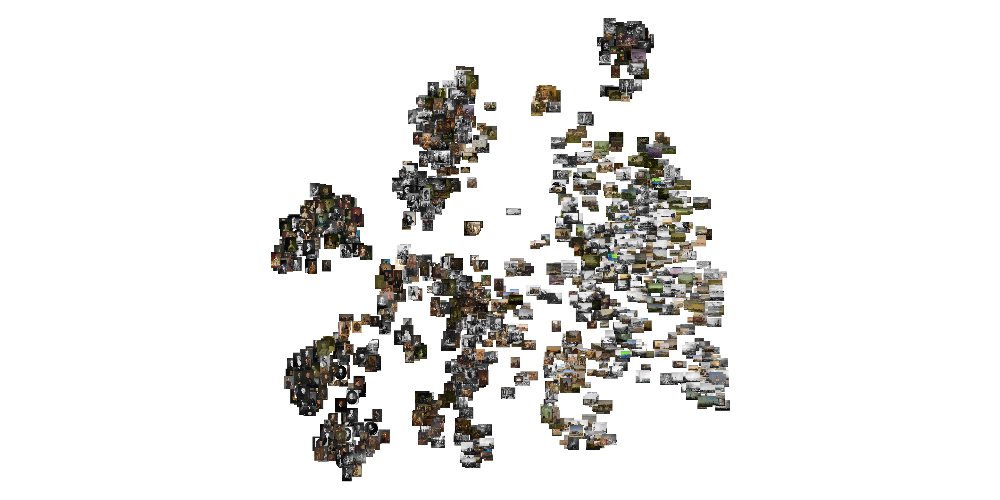

In [7]:
fig, axs = plt.subplots(1, 1, figsize=(40, 20))
t_sne_plot(axs, df, ds, 'grey_embedding')

Cluster distances and density does not mean much; distances between clusters are not meaningful!

In [6]:
def umap_plot(ax, df, ds, embedding):

    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # reduce dimensionality
    pca = PCA(n_components=50)
    pca_results = pca.fit_transform(embeddings_array)

    X = np.array(pca_results)
    umap_fitted = UMAP(n_components=2, random_state=42).fit_transform(X)
    df_umap = pd.DataFrame(umap_fitted, columns=["umap1", "umap2"])
    
    ax.scatter(df_umap['umap1'], df_umap['umap2'], color='white')

    ax.set_xlabel("")
    ax.set_ylabel("")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_umap.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["umap1"], row["umap2"]), frameon=False)
        ax.add_artist(ab)

    #plt.savefig(filename)

    np.seterr(divide='ignore', invalid='ignore')

Text(0.5, 0.98, 'UMAP on greyscaled embeddings, with n_PCA_components=50')

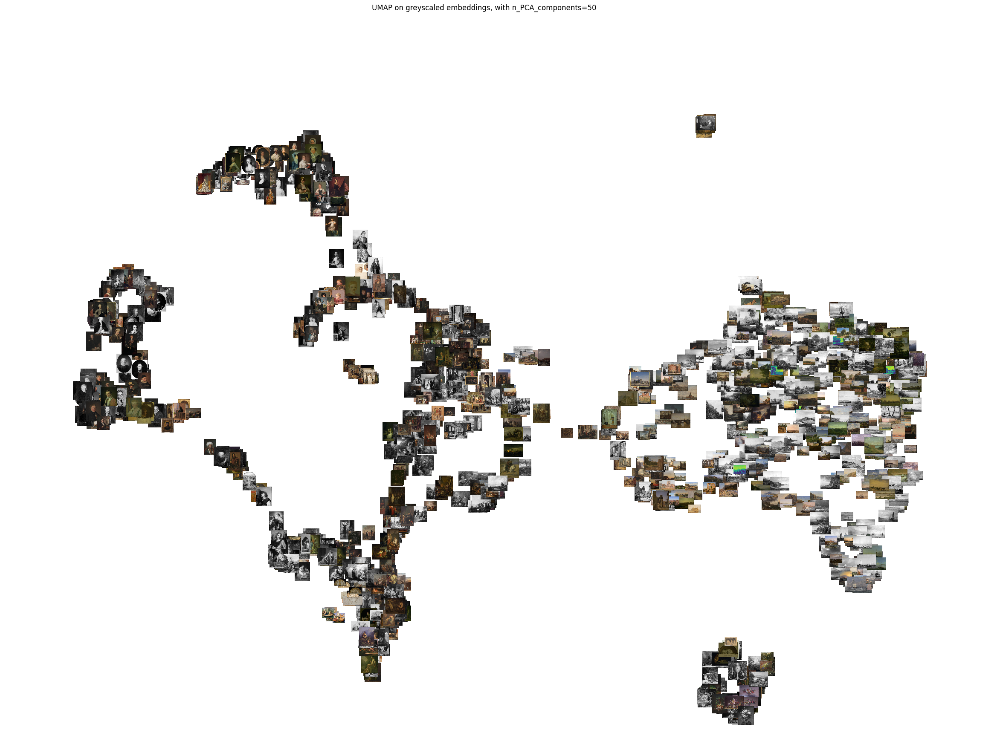

In [7]:
# umap
fig, axs = plt.subplots(1, 1, figsize=(30, 20))
umap_plot(axs, df, ds, 'grey_embedding')
fig.suptitle('UMAP on greyscaled embeddings, with n_PCA_components=50')

Text(0.5, 0.98, 'UMAP on colored embeddings, with n_PCA_components=50')

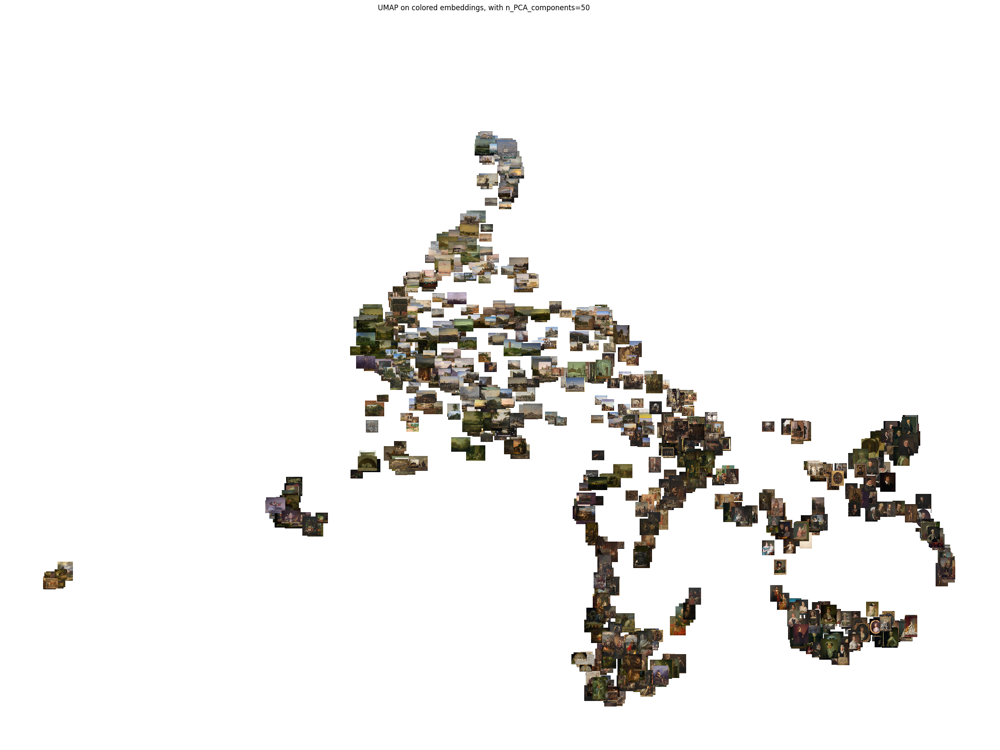

In [8]:
# umap
fig, axs = plt.subplots(1, 1, figsize=(30, 20))
umap_plot(axs, color_subset, ds_color, 'embedding')
fig.suptitle('UMAP on colored embeddings, with n_PCA_components=50')

### Clustering approaches

In [ ]:
# color by main artists

In [13]:
biggest_artists = df['first_artist'].value_counts().head(10).index.tolist()[1:] # don't include the first one as it's 'Ubekendt'

In [ ]:
def pca_binary(ax, df, ds, embedding, filename):
    embeddings_array = np.array(df[embedding].to_list(), dtype=np.float32)

    # to 2 dimensions
    pca = PCA(n_components=2)
    pca_results = pca.fit_transform(embeddings_array)
    df_pca = pd.DataFrame(pca_results, columns=["PCA1", "PCA2"])

    df_pca['artist'] = df['first_artist']
    
    ax.scatter(df_pca["PCA1"], df_pca["PCA2"], color='white')

    ax.set_xlabel("PCA1")
    ax.set_ylabel("PCA2")

    ax.axis("equal")
    ax.set_axis_off()

    for index, row in df_pca.iterrows():
        # add images to plot
        ab = AnnotationBbox(getImage(ds[index]['image']), (row["PCA1"], row["PCA2"]), frameon=False)
        ax.add_artist(ab)

    plt.savefig(filename)

    np.seterr(divide='ignore', invalid='ignore')

In [ ]:
import json

# load metadata json
json_path = os.path.join(data_path, 'metadata_paintings')

# Open and read the JSON file
with open(json_path, 'r') as file:
    metadata = json.load(file)

0       [0.2547459602355957, -0.6865944862365723, 0.94...
1       [0.7342177629470825, -0.6139540076255798, 0.10...
2       [0.722366213798523, -0.381448358297348, -0.525...
3       [0.24958491325378418, -0.5673973560333252, -0....
4       [-0.5517070889472961, 0.07065780460834503, 0.8...
                              ...                        
1682    [2.381985902786255, -0.8846017718315125, -0.91...
1683    [1.9805793762207031, -1.1544833183288574, -0.4...
1684    [0.7585954666137695, -0.9632124900817871, -0.7...
1685    [0.4516342878341675, -1.3397136926651, -1.2157...
1686    [0.47440075874328613, -0.5750328302383423, -1....
Name: embedding, Length: 1687, dtype: object

In [136]:
df['materials'] = [item.get('materials', pd.NA) for item in metadata]

In [140]:
df['materials'].iloc[1][0]

'Lærred'

In [141]:
materials_list = []
first_tags_list = []
for idx, row in df.iterrows():

    if isinstance(row['materials'], list):
        materials_list.append(row['materials'][0])
    else:
        materials_list.append(pd.NA)
    
    if isinstance(row['tags_en'], list):
        first_tags_list.append(row['tags_en'][0])
    
    else:
        first_tags_list.append(pd.NA)

df['materials'] = materials_list
df['technique'] = df['techniques'].explode()
df['first_tag'] = first_tags_list

In [ ]:
from sklearn.metrics import silhouette_score

In [119]:
X = np.vstack(df['grey_embedding'].values)

In [123]:
df.columns

Index(['smk_id', 'period', 'start_year', 'title', 'first_artist',
       'all_artists', 'num_artists', 'main_type', 'all_types',
       'image_thumbnail', 'gender', 'birth_death', 'nationality', 'history',
       'artist_roles', 'creator_roles', 'num_creators', 'techniques',
       'enrichment_url', 'content_person', 'has_text', 'colors',
       'geo_location', 'entropy', 'tags_en', 'image', 'rgb', 'embedding',
       'grey_embedding', 'exhibitions', 'acquisition_date',
       'responsible_department', 'documentation', 'on_display',
       'current_location_name', 'literary_reference', 'object_history_note',
       'exhibition_venues', 'smk_exhibitions', 'golden_titles', 'exb_canon',
       'n_exhibitions', 'n_golden_titles', 'n_smk_exhibitions', 'ex_years',
       'ex_distances', 'smk_distances', 'dist_canon', 'canon_idx',
       'mean_prod_year', 'prod_diff', 'prod_notes', 'technique', 'materials'],
      dtype='object')

In [ ]:
test = df.dropna(subset=['name', 'toy'])

In [151]:
def check_groups(df, embedding_col, variable):
    
    X = np.vstack(df[embedding_col].values)
    y = df[variable].values

    sil_score = silhouette_score(X, df[variable])

    return sil_score

In [ ]:
def get_cosim_mean_std(groups_dict, embedding_col, key):

    '''
    Calculate mean and SD cosine similarity for embedding column of dataset in groups_dict
    '''

    data = groups_dict[key]
    embeddings = np.stack(data[embedding_col].values)
    mean_cosim = cosine_similarity(embeddings).mean()
    std_cosim = cosine_similarity(embeddings).std()
    
    return mean_cosim, std_cosim

In [155]:
variables = ['first_artist', 'materials', 'technique', 'start_year', 'first_tag']

test = df.dropna(subset=variables)


for col in variables:
    sil_score = check_groups(test, 'grey_embedding', col)

    print(f'sil_score for {col}: {sil_score}')



sil_score for first_artist: -0.19749094224215905
sil_score for materials: -0.09996576750105687
sil_score for technique: -0.22891421899334882
sil_score for start_year: -0.11158022822706873
sil_score for first_tag: -0.22337057953196146


In [122]:
silhouette_score(X, df['techniques'])

TypeError: boolean value of NA is ambiguous

In [ ]:
def clustering(df, embedding_col, variable):
    
    #X = np.array(df[embedding].to_list(), dtype=np.float32)
    X = np.vstack(df[embedding_col].values)
    y = df[variable].values
    # change if input is list ? 
    n_clusters = np.unique(y).shape[0] # cluster based on number of unique ground truth labels

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)

    clusters = kmeans.fit_predict(X)
    
    # get performance metrics
    ari = round(adjusted_rand_score(y, clusters),3)

    # get v-score
    v_score = round(v_measure_score(y, clusters),3)

    return n_clusters, ari, v_score

In [108]:
X = np.vstack(df['grey_embedding'].values)

In [110]:
X.shape

(1687, 1024)

In [112]:
np.array(df['grey_embedding'].to_list(), dtype=np.float32).shape

(1687, 1024)

In [ ]:
variables = ['first_artist', 'start_year', 'technique']

In [24]:
clustering(df, 'grey_embedding', 'first_artist')

number of clusters: 290 , should be same as: 290
Adjusted Rand Index: 0.057
V-measure Score: 0.632


In [25]:
clustering(df, 'grey_embedding', 'start_year')

number of clusters: 121 , should be same as: 121
Adjusted Rand Index: 0.022
V-measure Score: 0.453


In [38]:
# remove na in df
# 
test = df[~df['technique'].isna()]

In [40]:
clustering(test, 'grey_embedding', 'technique')

number of clusters: 59 , should be same as: 59
Adjusted Rand Index: 0.004
V-measure Score: 0.171


In [54]:
metadata[1].keys()

dict_keys(['id', 'created', 'modified', 'responsible_department', 'acquisition_date', 'acquisition_date_precision', 'dimensions', 'documentation', 'exhibitions', 'inscriptions', 'materials', 'object_names', 'production', 'production_date', 'techniques', 'titles', 'number_of_parts', 'object_number', 'object_url', 'frontend_url', 'iiif_manifest', 'enrichment_url', 'similar_images_url', 'production_dates_notes', 'public_domain', 'rights', 'on_display', 'alternative_images', 'image_mime_type', 'image_iiif_id', 'image_iiif_info', 'image_width', 'image_height', 'image_size', 'image_thumbnail', 'image_native', 'image_cropped', 'image_orientation', 'image_hq', 'has_3d_file', 'has_image', 'colors', 'suggested_bg_color', 'entropy', 'contrast', 'saturation', 'colortemp', 'brightness', 'artist'])

In [ ]:
materials = [item.get('materials', pd.NA) for item in metadata]

In [59]:
df['materials'] = materials

In [61]:
df['materials'].explode().unique()

array([<NA>, 'Lærred', 'Pap', 'Træ', 'Papir', 'Metal', 'Kobber',
       'Tekstil', 'Zink', 'Finér', 'Karton', 'Alabast', 'Marmor',
       'Elfenben', 'Sten', 'Mahogny', 'Blik'], dtype=object)

In [78]:
testy = df[~df['materials'].isna()]

In [79]:
testy['materials'] = testy['materials'].apply(lambda x: x[0])

In [80]:
clustering(testy, 'grey_embedding', 'materials')

number of clusters: 14 , should be same as: 14
Adjusted Rand Index: 0.002
V-measure Score: 0.061


In [45]:
# cluster on decade


'3'

In [85]:
df['tags_en'].explode().value_counts(dropna=False)

tags_en
painting       1148
drawing         819
person          810
outdoor         781
clothing        611
               ... 
enclosure         1
dry               1
facial hair       1
beard             1
looking           1
Name: count, Length: 450, dtype: int64

In [87]:
len(df['tags_en'].explode().unique())

450

In [91]:
testy = df[~df['tags_en'].isna()]

In [92]:
testy['tags_first'] = testy['tags_en'].apply(lambda x: x[0])

In [95]:
len(testy['tags_first'].unique())

157

In [96]:
clustering(testy, 'grey_embedding', 'tags_first')

number of clusters: 157 , should be same as: 157
Adjusted Rand Index: 0.023
V-measure Score: 0.437


In [97]:
df

,smk_id,period,start_year,title,first_artist,all_artists,num_artists,main_type,all_types,image_thumbnail,...,ex_years,ex_distances,smk_distances,dist_canon,canon_idx,mean_prod_year,prod_diff,prod_notes,technique,materials
0,KMS8884,1835,1835,Parti af torvet i Amalfi,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/tt44ps41w_km...,...,"[2020, 2019, 2019]","[185, 184, 184]","[<NA>, 1, <NA>]",canon,0.002575,1835,0,[Værkdatering: 1835],Olie på papir monteret på lærred,<NA>
1,KMS4313,1870,1870,Leonora Christina i fængslet,Kristian Zahrtmann,[Kristian Zahrtmann],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/7d278w98c_KM...,...,"[2006, 2019, 2019, 2020, 2016, 2016]","[136, 149, 149, 150, 146, 146]","[<NA>, <NA>, <NA>, <NA>, <NA>, <NA>]",other,0.010300,1870,0,[Værkdatering: 1870],Olie på lærred,[Lærred]
2,KMS3880,1800,1800,Jurisprudensen. Allegorisk figur,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/mw22v869s_KM...,...,"[2008, 2009, 2009, 1992, 1989, 1964]","[208, 209, 209, 192, 189, 164]","[<NA>, <NA>, 79, <NA>, <NA>, <NA>]",canon,0.012876,1800,0,[Værkdatering: 1800],Olie på lærred,[Lærred]
3,KMS7591,1800,1800,Filosofien,Nicolai Abildgaard,[Nicolai Abildgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/3x816q91r_KM...,...,"[2008, 2009, 2009, 2001]","[208, 209, 209, 201]","[<NA>, <NA>, 18, <NA>]",canon,0.005150,1800,0,[Værkdatering: 1800],Olie på lærred,[Lærred]
4,KMS3769,1844,1844,Udsigt fra Athenatemplet på Akropolis,Martinus Rørbye,[Martinus Rørbye],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/w0892f396_KM...,...,<NA>,<NA>,<NA>,other,0.000000,1844,0,[Værkdatering: 1844],Olie på pap,[Pap]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1682,KMS4154,1849,1849,Landskab fra Skiveegnen med Skivehus,Christen Dalsgaard,[Christen Dalsgaard],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/6m311t23b_KM...,...,"[2001, 2001, 2001]","[152, 152, 152]","[<NA>, <NA>, <NA>]",canon,0.001288,1849,0,[Værkdatering: 1849],"Olie på papir, klæbet på lærred",[Papir]
1683,KMS8817,1817,1817,Efter stormen,Caspar David Friedrich,[Caspar David Friedrich],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/db78tg36b_KM...,...,"[2017, 2023, 2024]","[200, 206, 207]","[1, <NA>, <NA>]",canon,0.003863,1817,0,"[Værkdatering: 1817, Den angivne datering fore...",Olie på lærred,<NA>
1684,KMS8925,1788-1792,1788,"Portræt af Kennett Dixon, der spiller badminton",William Beechey,[William Beechey],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/rf55zc238_km...,...,<NA>,<NA>,<NA>,other,0.000000,1790,4,[Værkdatering: Ca. 1790],Olie på lærred,[Lærred]
1685,KMS9021,1825-1829,1825,Selvportræt,Emil Ditlev Bærentzen,[Emil Ditlev Bærentzen],1,Maleri,[Maleri],https://iip-thumb.smk.dk/iiif/jp2/9880vw79j_km...,...,<NA>,<NA>,<NA>,other,0.000000,1827,4,[Værkdatering: Ca. 1827],Olie på lærred,[Lærred]


In [98]:
df['enrichment_url'][456]

'https://enrichment.api.smk.dk/api/enrichment/KMS3678'

In [100]:
df['colors']

0       [#666666, #a7aad0, #795025, #848bba, #fdcec7, ...
1       [#795025, #3a351f, #908d41, #77733d, #d0da83, ...
2       [#777777, #5a5527, #795025, #214e77, #fcf1a6, ...
3       [#3a351f, #333333, #555555, #2c3b20, #777777, ...
4       [#5a5527, #ffe7c9, #fdcec7, #f9aca5, #593d1c, ...
                              ...                        
1682        [#999999, #888888, #777777, #908d41, #444444]
1683        [#666666, #382510, #230b09, #999999, #888888]
1684    [#222222, #999999, #111111, #777777, #657b42, ...
1685                                                 <NA>
1686        [#77733d, #000000, #795025, #080614, #541f0e]
Name: colors, Length: 1687, dtype: object

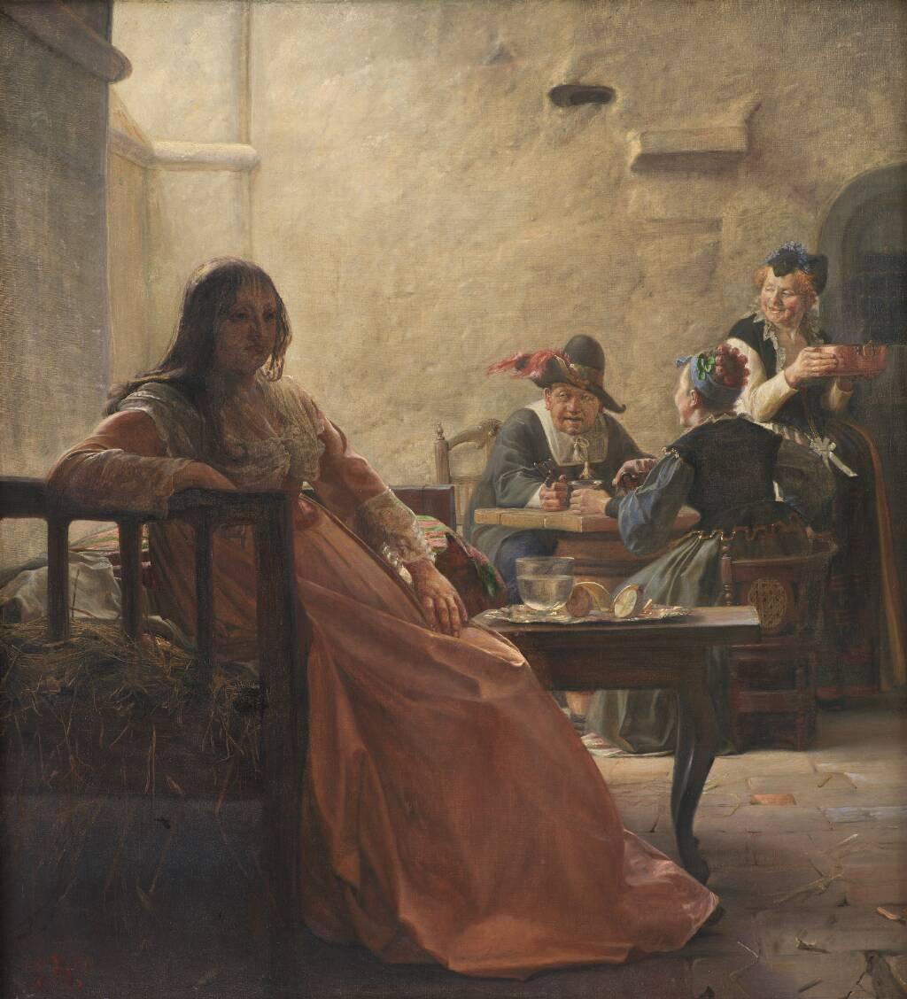

In [102]:
ds[1]['image']

In [103]:
df.columns

Index(['smk_id', 'period', 'start_year', 'title', 'first_artist',
       'all_artists', 'num_artists', 'main_type', 'all_types',
       'image_thumbnail', 'gender', 'birth_death', 'nationality', 'history',
       'artist_roles', 'creator_roles', 'num_creators', 'techniques',
       'enrichment_url', 'content_person', 'has_text', 'colors',
       'geo_location', 'entropy', 'tags_en', 'image', 'rgb', 'embedding',
       'grey_embedding', 'exhibitions', 'acquisition_date',
       'responsible_department', 'documentation', 'on_display',
       'current_location_name', 'literary_reference', 'object_history_note',
       'exhibition_venues', 'smk_exhibitions', 'golden_titles', 'exb_canon',
       'n_exhibitions', 'n_golden_titles', 'n_smk_exhibitions', 'ex_years',
       'ex_distances', 'smk_distances', 'dist_canon', 'canon_idx',
       'mean_prod_year', 'prod_diff', 'prod_notes', 'technique', 'materials'],
      dtype='object')